---
## **1. Introduction to Project**

<img width = 25%  src = "https://www.insaid.co/wp-content/uploads/2022/02/logo-3.png" align =top left > <img width = 30% src = "https://www.insaid.co/wp-content/uploads/2022/03/skin-cancer.png" align = top centre >


## **Company Introduction**

**Cell Medica** is a major Cancer Research Institute..
*   **Melanoma**, also known as malignant melanoma, is a type of skin cancer that develops from the pigment-producing cells known as melanocytes.
*   Melanoma is the most dangerous type of skin cancer. Globally, in 2012, it newly occurred in 232,000 people.
* Melanomas are present in many different shapes, sizes, and colours.

**Current Scenario**
* The company is working hard to understand the severity of melanoma caused by the pigment-producing cell that has been reported every year in the United States.
* The team of researches at the company have gathered some data to understand the size of the tumor appearing on the skin due to these pigment-producing cells.
* This information can help the researchers understand the factor that triggers the spread of these cancer cells underneath the skin.

---





---

## **2. Problem Statement**

**The current process suffers from the following problems:**
* The size of the tumor is dependent upon the area, size of the pigment etc..
* The primary cause of melanoma is ultraviolet light (UV) exposure in those with low levels of the skin pigment melanin.
* The current process to identify the tumor size requires a lot of assumption, which might not be true all the time and it requires detail analysis of the medical report manually
* They want to automate the process of predicting the tumor size, based on the medical observation data

---



## **3. Dataset Feature Description**
The Dataset contains the following columns:

|**Column Name**|**Description**|
| ------------- |:------------- :| 
|**Id**|Unique identity of each observation.|
|**mass_npea**|	The mass of the area understudy for melanoma tumor.|
|**size_npear**|	The size of the area understudy for melanoma tumor.|
|**malign_ratio**|	Ratio of normal to malign surface under study.|
|**damage_size**|	Unrecoverable area of skin damaged by the tumor.|
|**exposed_area**	|Total area exposed to the tumor.|
|**std_dev_malign**	|Standard deviation of malign skin measurements.|
|**err_malign**	|Error in malign skin measurements.|
|**malign_penalty**|Penalty applied due to measurement error in the lab.|
|**damage_ratio**|	The ratio of damage to total spread on the skin.|
|**tumor_size**|	Size of the melanoma tumor.|

In [1]:
# To use some functions from tensorflow_docs
!pip install git+https://github.com/tensorflow/docs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-mxefwmve
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-mxefwmve
  Resolved https://github.com/tensorflow/docs to commit 49c6a1b871dd512951ae9b70aa7724483d2db4c5
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0.dev0-py3-none-any.whl size=178984 sha256=a176f9143b945fdf31c2df60aa4d91deb5f73468cae978c88c549124aae9598e
  Stored in directory: /tmp/pip-ephem-wheel-cache-a69w974y/wheels/3b/ee/a2/ab4d36a9a4af495bcb936f3e849d4b497b65fa40548a68d6c3
Successfully built tensorflow-docs


In [3]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


Importing all the libraries

In [5]:
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, mean_squared_error, mean_absolute_error, r2_score   # To evaluate the metrics
import matplotlib.pyplot as plt
%matplotlib inline

import tensorflow as tf
print(tf.__version__)
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input,BatchNormalization
from tensorflow.keras import optimizers
from tensorflow.keras.optimizers import Adam, RMSprop, Adagrad
import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_docs.modeling

2.11.0


## **4. Data Acquisition and Description**

In [6]:
df_train = pd.read_csv("https://raw.githubusercontent.com/sm24abr/Data_Repo/main/MelanomaTumorDetection/tumor_train.csv")
df_test = pd.read_csv("https://raw.githubusercontent.com/sm24abr/Data_Repo/main/MelanomaTumorDetection/tumor_test.csv")

> **Train Dataset**



In [7]:
df_train.head()

,Id,mass_npea,size_npear,malign_ratio,damage_size,exposed_area,std_dev_malign,err_malign,malign_penalty,damage_ratio,tumor_size
0,2484,8966.25,2290.10,0.25541,86.3614,1.210154e+06,123.099,3801.09,37,35.3347,2.040
1,7971,23451.80,5523.74,0.23553,318.7650,3.230021e+06,400.988,6233.68,154,19.8012,0.950
2,5808,9943.24,3395.25,0.34146,119.6230,1.314472e+06,182.907,4458.68,182,29.5710,1.383
3,3944,9217.15,1679.83,0.18225,89.1005,1.315326e+06,126.542,4173.45,43,32.0433,0.745
4,2304,12920.00,4785.19,0.37037,170.0430,1.773571e+06,203.413,4901.15,161,28.0393,6.830


In [8]:
df_train.shape

(7316, 11)

Checking the datatypes and no. of rows and columns in the dataset

In [9]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7316 entries, 0 to 7315
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Id              7316 non-null   int64  
 1   mass_npea       7316 non-null   float64
 2   size_npear      7316 non-null   float64
 3   malign_ratio    7316 non-null   float64
 4   damage_size     7316 non-null   float64
 5   exposed_area    7316 non-null   float64
 6   std_dev_malign  7316 non-null   float64
 7   err_malign      7316 non-null   float64
 8   malign_penalty  7316 non-null   int64  
 9   damage_ratio    7316 non-null   float64
 10  tumor_size      7316 non-null   float64
dtypes: float64(9), int64(2)
memory usage: 628.8 KB


In [10]:
df_train.describe()

,Id,mass_npea,size_npear,malign_ratio,damage_size,exposed_area,std_dev_malign,err_malign,malign_penalty,damage_ratio,tumor_size
count,7316.000000,7316.000000,7316.000000,7316.000000,7316.000000,7.316000e+03,7316.000000,7316.000000,7316.000000,7316.000000,7316.000000
mean,4572.895571,9903.203540,3033.187635,0.303091,103.910231,1.372354e+06,146.409698,3979.876145,69.964735,34.441391,7.693081
std,2634.666726,4035.017571,1453.517395,0.062637,55.303260,5.610871e+05,70.223909,1472.446085,55.756789,5.976883,6.092732
min,1.000000,2864.760000,520.330000,0.121610,10.310100,3.878534e+05,31.970400,1089.190000,0.000000,15.228000,0.000000
25%,2298.750000,6983.410000,1986.167500,0.258622,64.011200,9.598202e+05,95.617575,3175.735000,31.000000,30.211175,2.301500
50%,4561.500000,8894.730000,2688.000000,0.300660,88.608100,1.238623e+06,126.619000,3849.515000,54.000000,35.236250,5.007000
75%,6850.250000,12137.375000,3846.612500,0.343133,134.358000,1.696990e+06,182.591500,4671.912500,91.000000,38.826025,13.336000
max,9145.000000,36995.400000,13535.000000,0.525300,344.346000,4.978616e+06,528.890000,53031.300000,340.000000,46.546400,20.985000


Checking for duplicate values

In [11]:
df_train.duplicated().sum()

0

Checking for missing values

In [12]:
df_train.isnull().sum()

Id                0
mass_npea         0
size_npear        0
malign_ratio      0
damage_size       0
exposed_area      0
std_dev_malign    0
err_malign        0
malign_penalty    0
damage_ratio      0
tumor_size        0
dtype: int64

Check the correlation

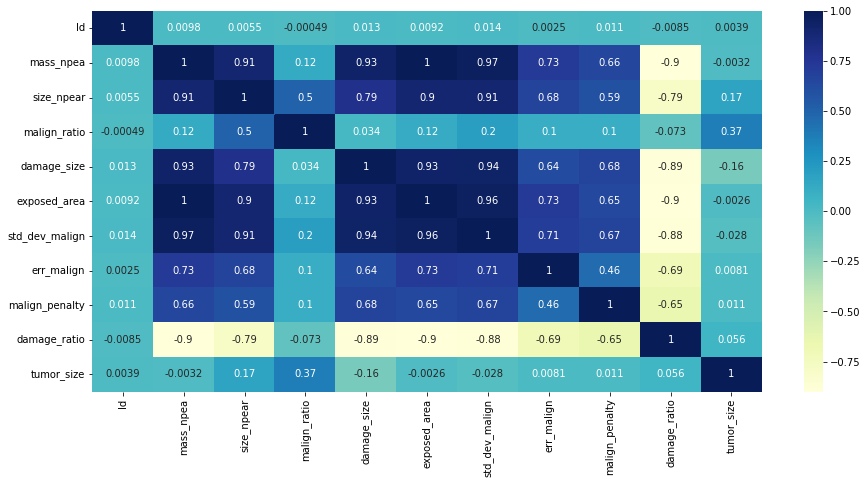

In [13]:
fig = plt.figure(figsize = [15, 7])
sns.heatmap(df_train.corr(), cmap='YlGnBu',annot = True)

In [14]:
df_train.skew()

Id                0.005002
mass_npea         1.075352
size_npear        1.135384
malign_ratio      0.238677
damage_size       1.218063
exposed_area      1.041082
std_dev_malign    1.129102
err_malign        7.596901
malign_penalty    1.625086
damage_ratio     -0.457224
tumor_size        0.586215
dtype: float64

> **Test Dataset**



In [15]:
df_test.head()

,Id,mass_npea,size_npear,malign_ratio,damage_size,exposed_area,std_dev_malign,err_malign,malign_penalty,damage_ratio
0,1962,9442.86,2608.70,0.27626,76.0109,1.283025e+06,119.600,4284.97,54,33.7830
1,7018,10488.60,2389.16,0.22778,123.7160,1.431194e+06,146.515,3638.58,13,34.7684
2,711,14648.60,4799.59,0.32764,172.1850,2.009699e+06,257.127,4864.58,29,29.0607
3,3443,15068.60,3005.83,0.19947,195.6130,2.079564e+06,246.238,5105.25,178,25.4230
4,7087,10101.70,3469.03,0.34341,96.0650,1.435378e+06,135.567,4604.39,105,30.7345


In [16]:
df_test.shape

(1830, 10)

Checking the datatypes and no. of rows and columns in the dataset

In [17]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1830 entries, 0 to 1829
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Id              1830 non-null   int64  
 1   mass_npea       1830 non-null   float64
 2   size_npear      1830 non-null   float64
 3   malign_ratio    1830 non-null   float64
 4   damage_size     1830 non-null   float64
 5   exposed_area    1830 non-null   float64
 6   std_dev_malign  1830 non-null   float64
 7   err_malign      1830 non-null   float64
 8   malign_penalty  1830 non-null   int64  
 9   damage_ratio    1830 non-null   float64
dtypes: float64(8), int64(2)
memory usage: 143.1 KB


In [18]:
df_test.describe()

,Id,mass_npea,size_npear,malign_ratio,damage_size,exposed_area,std_dev_malign,err_malign,malign_penalty,damage_ratio
count,1830.000000,1830.000000,1830.000000,1830.000000,1830.000000,1.830000e+03,1830.000000,1830.000000,1830.000000,1830.000000
mean,4570.918579,9902.447038,3031.389432,0.303051,103.869681,1.372794e+06,145.882633,4045.148153,69.389617,34.542653
std,2663.758543,4162.315063,1497.466875,0.062132,56.081958,5.789639e+05,71.670917,2679.433678,55.912194,5.957431
min,0.000000,3328.180000,510.530000,0.114820,11.557600,4.529849e+05,36.084900,1108.900000,0.000000,16.768400
25%,2240.500000,7007.345000,1977.757500,0.260153,64.043725,9.592632e+05,96.867175,3187.795000,31.000000,30.714925
50%,4639.000000,8901.460000,2669.170000,0.302330,87.576450,1.234605e+06,124.890500,3836.500000,53.500000,35.259750
75%,6877.750000,12020.300000,3742.282500,0.342247,133.485750,1.672354e+06,180.941500,4632.490000,88.750000,38.713300
max,9144.000000,29601.900000,10935.000000,0.524280,346.420000,4.172679e+06,461.060000,91983.700000,337.000000,46.546400


Checking for duplicate values

In [19]:
df_test.duplicated().sum()

0

Checking for missing values

In [20]:
df_test.isnull().sum()

Id                0
mass_npea         0
size_npear        0
malign_ratio      0
damage_size       0
exposed_area      0
std_dev_malign    0
err_malign        0
malign_penalty    0
damage_ratio      0
dtype: int64

Check the correlation

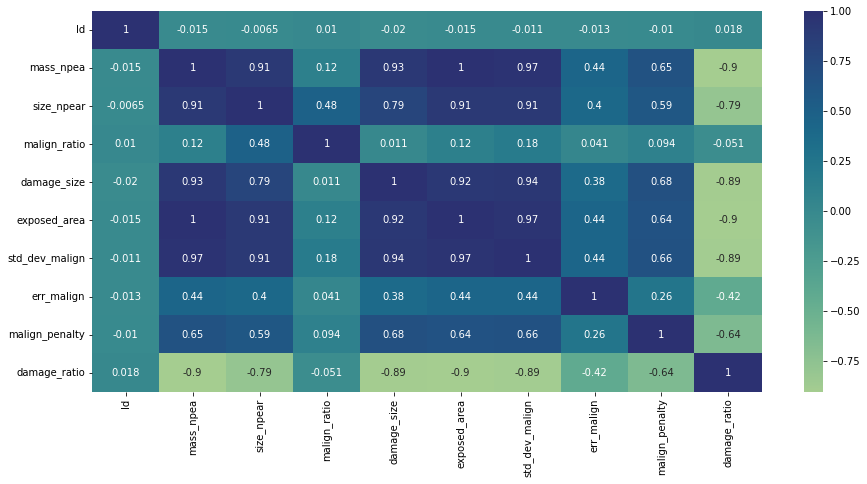

In [21]:
fig = plt.figure(figsize = [15, 7])
sns.heatmap(df_test.corr(), cmap='crest',annot = True)

In [22]:
df_test.skew()

Id                -0.019336
mass_npea          1.179328
size_npear         1.294453
malign_ratio       0.206291
damage_size        1.245248
exposed_area       1.149590
std_dev_malign     1.234995
err_malign        21.950376
malign_penalty     1.774763
damage_ratio      -0.484615
dtype: float64

**Observations**:
----------------

> There are **7316** observations with **11** columns in the **df_train** dataset of size 628.4 KB.There are no categorical columns in this dataset.

> There are **1830** observations with **10** columns in the **df_test** dataset of size 143.1 KB.There are no categorical columns in this dataset.

> There are no duplicate and no missing values in both these datasets.

> The column "**err_malign**" has highly positively skewed data.

> The columns: **exposed_area**, **damage_size**, **std_dev_malign** and **mass_npea** are strongly correlated.

> There are outliers in most of the feature columns looking at the min-max range values.

## 4.1. Pandas Profiling before Data Preprocessing

In [23]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df = df_train)
profile.to_file(output_file = 'Pre Profiling Report.html')
print('Accomplished!')

<ipython-input-23-3160886b10f6>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Accomplished!


In [76]:
profile.to_notebook_iframe()

# **5. Data Exploration**

## **5.1 Exploratory Data Analysis**

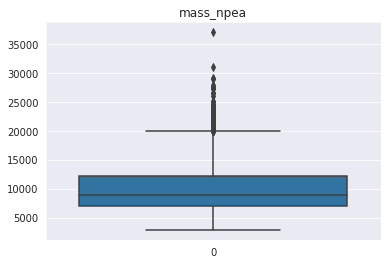

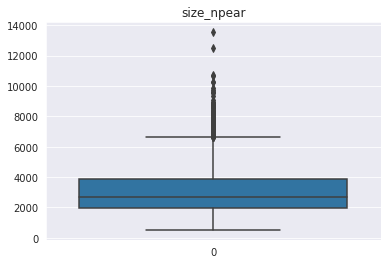

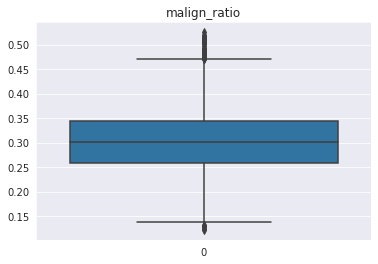

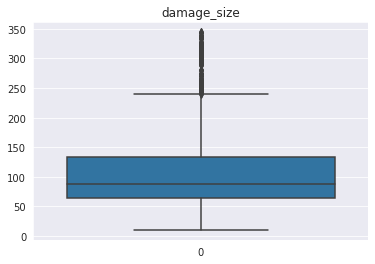

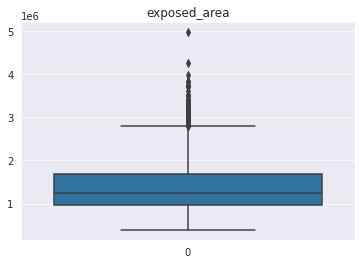

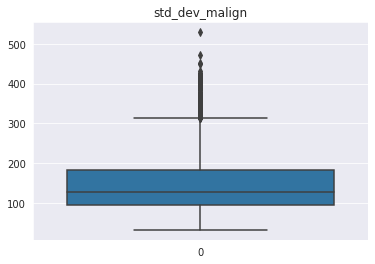

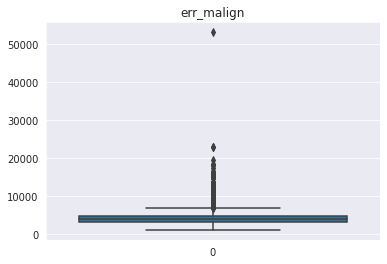

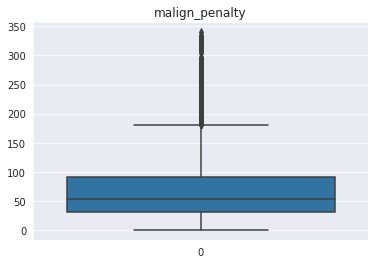

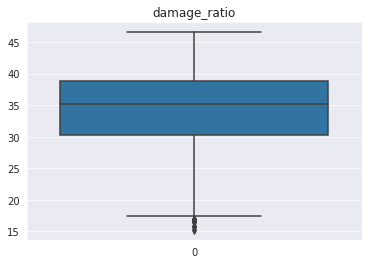

In [25]:
columns = ['mass_npea',	'size_npear',	'malign_ratio',	'damage_size',	'exposed_area',	'std_dev_malign',	'err_malign',	'malign_penalty',	'damage_ratio']

for i in columns:
  sns.set_style("darkgrid")
  plt.subplots(1,1)
  sns.boxplot(data= df_train[i]);
  plt.title(i)

**Observations**:
----------------

> All the features plots show that they have outliers in their data.

Correlation of the features with the target variable '**tumor_size**'

In [26]:
data = df_train.drop(['tumor_size'], axis = 1) 
data.corrwith(df_train['tumor_size'])

Id                0.003918
mass_npea        -0.003202
size_npear        0.167635
malign_ratio      0.372830
damage_size      -0.162081
exposed_area     -0.002605
std_dev_malign   -0.028157
err_malign        0.008130
malign_penalty    0.011254
damage_ratio      0.055624
dtype: float64

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


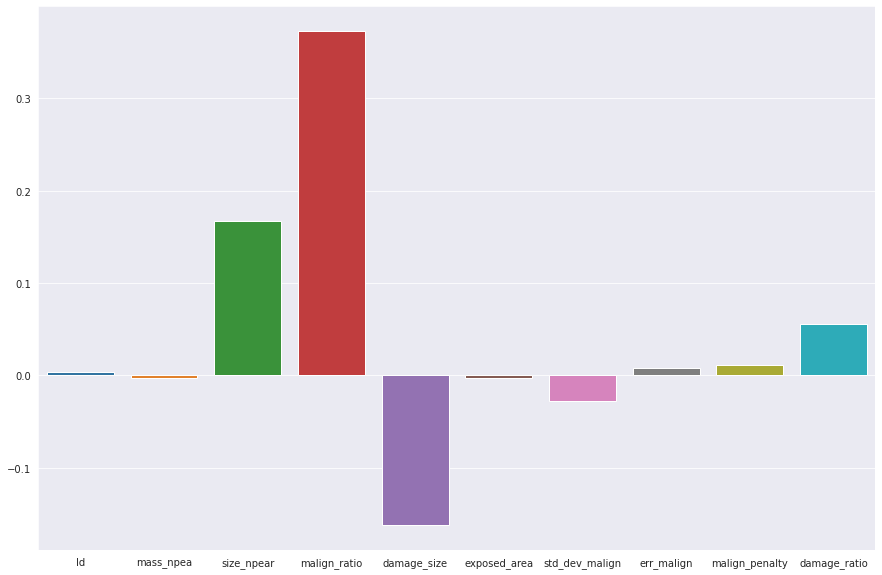

In [27]:
plt.figure(figsize = (15,10))
sns.barplot(data.columns,data.corrwith(df_train['tumor_size']))

**Observations**:
----------------

> We can see that the column **malign_ratio** followed by **size_npear** is highly positively correlated with the target variable **tumor_size**.

> Also that the column **damage_size** is highly negatively correlated with the target variable **tumor_size**.

## **5.2 Split the train dataset into features X and target vector Y**

In [28]:
X = df_train.drop(['Id','tumor_size'], axis = 1)  # Ignoring the columns 'Id' and 'tumor_size' from features
Y = df_train['tumor_size']
X.head()

,mass_npea,size_npear,malign_ratio,damage_size,exposed_area,std_dev_malign,err_malign,malign_penalty,damage_ratio
0,8966.25,2290.10,0.25541,86.3614,1.210154e+06,123.099,3801.09,37,35.3347
1,23451.80,5523.74,0.23553,318.7650,3.230021e+06,400.988,6233.68,154,19.8012
2,9943.24,3395.25,0.34146,119.6230,1.314472e+06,182.907,4458.68,182,29.5710
3,9217.15,1679.83,0.18225,89.1005,1.315326e+06,126.542,4173.45,43,32.0433
4,12920.00,4785.19,0.37037,170.0430,1.773571e+06,203.413,4901.15,161,28.0393


In [29]:
Y.head()

0    2.040
1    0.950
2    1.383
3    0.745
4    6.830
Name: tumor_size, dtype: float64

## **5.3 Normalizing the Data**



> Function for normalizing data



In [30]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler() 
def norm_data (data):
  data_scaled = scaler.fit_transform(data)
  return data_scaled

In [31]:
Scaled_X = norm_data(X)

## **5.4 Splitting the data into train and test**

In [32]:
X_train, X_valid, y_train, y_valid = train_test_split(Scaled_X,Y,test_size=0.25,random_state = 25)

In [33]:
print(X_train.shape,y_train.shape)

(5487, 9) (5487,)


In [34]:
print(X_valid.shape,y_valid.shape)

(1829, 9) (1829,)


# **6. Model Creation**

> **Creating a Deep Learning Model**








### **First Model**

*   Let us now build a Sequential model with two densely connected hidden layers, and an output layer that returns a single, continuous value.





In [35]:
def create_model():
  model1 = tf.keras.Sequential([layers.Dense(64, activation='relu', input_shape=[len(X.keys())]),
                            layers.Dense(64, activation='relu'),
                            layers.Dense(1)])

  # Defining the optimizer with a specific learning rate of 0.001
  optimizer = tf.keras.optimizers.Adam(0.001)

  # Compiling the model
  model1.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse'])
  return model1
 

In [36]:
model1 = create_model()

In [37]:
model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                640       
                                                                 
 dense_1 (Dense)             (None, 64)                4160      
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 4,865
Trainable params: 4,865
Non-trainable params: 0
_________________________________________________________________


>> Training the model for 1000 epochs with **fit** method and recording the training and validation accuracy in the history object.

>> We are using tfdocs.modeling.EpochDots() callback to print a "." every epoch, with reports being generated after each 100 epochs.

**NOTE**: These print settings are the default values, i. e. printing a "." after each epoch and a report after 100 epochs.
We can change these as per our requirements in the callback.

In [38]:
EPOCHS =1000

In [39]:
history = model1.fit(X_train,y_train, epochs=EPOCHS, validation_split=0.2,
                    verbose=0, callbacks=[tfdocs.modeling.EpochDots()])


Epoch: 0, loss:53.4516,  mae:5.5533,  mse:53.4516,  val_loss:33.4609,  val_mae:4.6399,  val_mse:33.4609,  
....................................................................................................
Epoch: 100, loss:17.6005,  mae:3.2491,  mse:17.6005,  val_loss:18.8575,  val_mae:3.3460,  val_mse:18.8575,  
....................................................................................................
Epoch: 200, loss:15.3608,  mae:3.0103,  mse:15.3608,  val_loss:18.0187,  val_mae:3.2184,  val_mse:18.0187,  
....................................................................................................
Epoch: 300, loss:14.0870,  mae:2.8560,  mse:14.0870,  val_loss:18.4962,  val_mae:3.1704,  val_mse:18.4962,  
....................................................................................................
Epoch: 400, loss:13.2929,  mae:2.7646,  mse:13.2929,  val_loss:18.9312,  val_mae:3.1823,  val_mse:18.9312,  
....................................................

>> Visualizing the model's training progress using the stats stored in the history object.

In [40]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
995,9.783283,2.371330,9.783283,20.684576,3.283717,20.684576,995
996,9.729678,2.355654,9.729678,19.977322,3.226746,19.977322,996
997,9.737482,2.356572,9.737482,20.512295,3.227329,20.512295,997
998,9.882738,2.385432,9.882738,20.707392,3.287188,20.707392,998
999,9.802184,2.368964,9.802184,20.705193,3.339512,20.705193,999


In [41]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)


>> Plotting the **MAE** plot for train and val set.











Text(0, 0.5, 'MAE[tumor_size]')

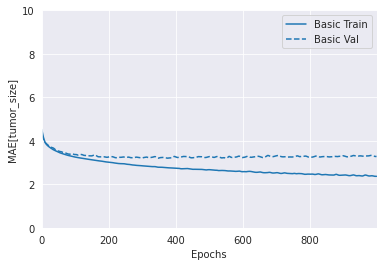

In [42]:
plotter.plot({'Basic': history}, metric="mae")
plt.ylim([0, 10])
plt.ylabel('MAE[tumor_size]')

>> Plotting the **MSE** plot for train and val set.

Text(0, 0.5, 'MSE[tumor_size^2]')

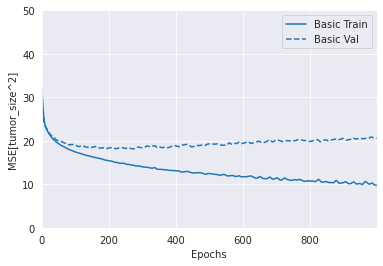

In [43]:
plotter.plot({'Basic': history}, metric="mse")
plt.ylim([0, 50])
plt.ylabel('MSE[tumor_size^2]')


- This graph shows increase in the validation error as the epoch increases.

- Let's update the `model.fit` call to automatically stop training when the validation score doesn't improve.

> **Solution**:
- We'll use an ***EarlyStopping callback*** that tests a training condition for  every epoch.
- If a set amount of epochs elapses without showing improvement, then automatically stop the training.

In [44]:
# The patience parameter is the amount of epochs to check for improvement
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=7)

In [45]:
early_history = model1.fit(X_train, y_train, epochs=EPOCHS, validation_split=0.2,
                          verbose=0, callbacks=[early_stop, tfdocs.modeling.EpochDots()])


Epoch: 0, loss:9.7338,  mae:2.3455,  mse:9.7338,  val_loss:20.2448,  val_mae:3.3391,  val_mse:20.2448,  
.............

In [46]:
early_hist = pd.DataFrame(early_history.history)
early_hist['epoch'] = early_history.epoch
early_hist.tail()

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
8,9.789758,2.362326,9.789758,20.977650,3.292920,20.977650,8
9,9.875436,2.388033,9.875436,20.411200,3.244884,20.411200,9
10,9.818203,2.369478,9.818203,20.799461,3.344590,20.799461,10
11,9.581971,2.333291,9.581971,20.471224,3.312312,20.471224,11
12,9.712790,2.350469,9.712790,20.348169,3.251844,20.348169,12


* The training stopped at the 19th epoch before completing the 1000 epochs due to our EarlyStopping callback.

>> Plotting the **MAE** plot for train and val set with **EarlyStopping** Callback implemented.

Text(0, 0.5, 'MAE [tumor_size]')

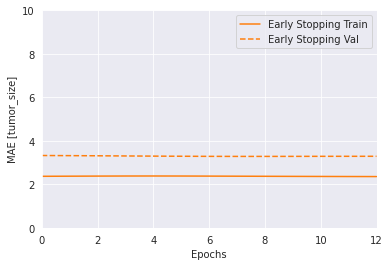

In [47]:
plotter.plot({'Early Stopping': early_history}, metric="mae")
plt.ylim([0, 10])
plt.ylabel('MAE [tumor_size]')

>> Plotting the **MSE** plot for train and val set with **EarlyStopping** Callback implemented.

Text(0, 0.5, 'MSE [tumor_size^2]')

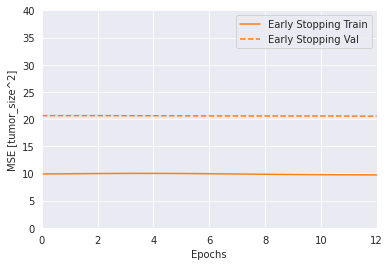

In [48]:
plotter.plot({'Early Stopping': early_history}, metric="mse")
plt.ylim([0, 40])
plt.ylabel('MSE [tumor_size^2]')

### **Second Model**

* Here, we are increasing the number of hidden layers from 2 to 4 i. e. 
adding 2 additional layers.

* Next, we are using 256 hidden units instead of 64.

In [49]:
model2 = tf.keras.Sequential([layers.Dense(256, activation='relu', input_shape=[len(X.keys())]),
                          layers.Dense(256, activation='relu'),
                          layers.Dense(256, activation='relu'),
                          layers.Dense(256, activation='relu'),
                          layers.Dense(1)])

In [50]:
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 256)               2560      
                                                                 
 dense_4 (Dense)             (None, 256)               65792     
                                                                 
 dense_5 (Dense)             (None, 256)               65792     
                                                                 
 dense_6 (Dense)             (None, 256)               65792     
                                                                 
 dense_7 (Dense)             (None, 1)                 257       
                                                                 
Total params: 200,193
Trainable params: 200,193
Non-trainable params: 0
_________________________________________________________________


In [51]:
# Defining the optimizer with a specific learning rate of 0.001
optimizer = tf.keras.optimizers.RMSprop(0.001)

# Compiling the model
model2.compile(loss='mse', optimizer=optimizer, metrics=['mae','mse'])

In [52]:
history_large = model2.fit(X_train,y_train, epochs=100, validation_split=0.2,
                          verbose=0, callbacks=[early_stop,tfdocs.modeling.EpochDots()])


Epoch: 0, loss:31.3843,  mae:4.3856,  mse:31.3843,  val_loss:30.5514,  val_mae:4.1858,  val_mse:30.5514,  
.......................

In [53]:
hist_large = pd.DataFrame(history_large.history)
hist_large['epoch'] = history_large.epoch
hist_large.tail()

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
18,16.198599,2.991596,16.198599,21.759243,3.638409,21.759243,18
19,15.665524,2.934383,15.665524,19.344524,3.256646,19.344524,19
20,15.833010,2.925007,15.833010,21.620855,3.493582,21.620855,20
21,15.345490,2.910574,15.345490,21.594074,3.388198,21.594074,21
22,15.012170,2.830018,15.012170,20.250322,3.394492,20.250322,22


>> Plotting the **MAE** plot for train and val set by increasing the no. of dense layers.

Text(0, 0.5, 'MAE [tumor_size]')

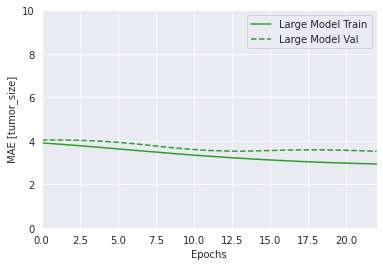

In [54]:
plotter.plot({'Large Model': history_large}, metric="mae")
plt.ylim([0, 10])
plt.ylabel('MAE [tumor_size]')

>> Plotting the **MSE** plot for train and val set by increasing the no. of dense layers.

Text(0, 0.5, 'MSE [tumor_size^2]')

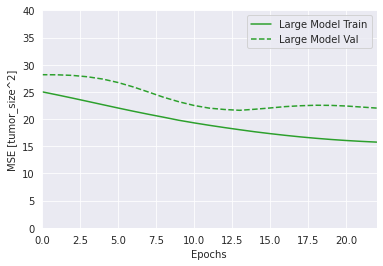

In [55]:
plotter.plot({'Large Model': history_large}, metric="mse")
plt.ylim([0, 40])
plt.ylabel('MSE [tumor_size^2]')

### **Third Model**

- We can try to incorporate Dropout in this model.

In [56]:
model3 = tf.keras.Sequential([layers.Dense(256, activation='relu', input_shape=[len(X.keys())]),
                          layers.Dense(256, activation='relu'),
                          layers.Dropout(0.5),
                          layers.Dense(256, activation='relu'),
                          layers.Dropout(0.5),
                          layers.Dense(256, activation='relu'),
                          layers.Dropout(0.5),
                          layers.Dense(1)])

In [57]:
model3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 256)               2560      
                                                                 
 dense_9 (Dense)             (None, 256)               65792     
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_10 (Dense)            (None, 256)               65792     
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_11 (Dense)            (None, 256)               65792     
                                                                 
 dropout_2 (Dropout)         (None, 256)              

In [58]:
# Defining the optimizer with a specific learning rate of 0.001
optimizer = tf.keras.optimizers.Adam(0.001)

# Compiling the model
model3.compile(loss='mse', optimizer=optimizer, metrics=['mae','mse'])

In [59]:
history_dropout = model3.fit(X_train,y_train, epochs=90, validation_split=0.2,
                          verbose=0, callbacks=[early_stop,tfdocs.modeling.EpochDots()])


Epoch: 0, loss:39.1618,  mae:4.8141,  mse:39.1618,  val_loss:26.8448,  val_mae:4.2290,  val_mse:26.8448,  
....................................

In [60]:
history_drpt = pd.DataFrame(history_dropout.history)
history_drpt['epoch'] = history_dropout.epoch
history_drpt.tail()

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
31,18.753559,3.305243,18.753559,19.050859,3.273037,19.050859,31
32,18.278210,3.253133,18.278210,19.097794,3.315881,19.097794,32
33,18.344900,3.269795,18.344900,18.988670,3.196611,18.988670,33
34,18.729900,3.296216,18.729900,19.357077,3.382232,19.357077,34
35,17.805685,3.213328,17.805685,19.256060,3.327013,19.256060,35


>> Plotting the **MAE** plot for train and val set by introducing Dropout layers.

Text(0, 0.5, 'MAE [tumor_size]')

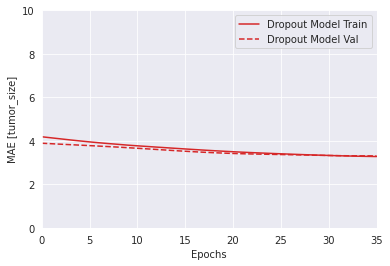

In [61]:
plotter.plot({'Dropout Model': history_dropout}, metric="mae")
plt.ylim([0, 10])
plt.ylabel('MAE [tumor_size]')

>> Plotting the **MSE** plot for train and val set by introducing Dropout layers.

Text(0, 0.5, 'MSE [tumor_size^2]')

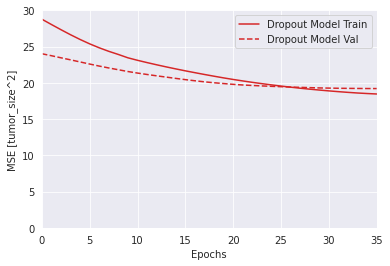

In [62]:
plotter.plot({'Dropout Model': history_dropout}, metric="mse")
plt.ylim([0, 30])
plt.ylabel('MSE [tumor_size^2]')

### **Fourth Model**

- We can try to incorporate Batch Normalisation in this model.

In [63]:
model4 = tf.keras.Sequential([layers.Dense(256, input_shape=[len(X.keys())]),
                          layers.BatchNormalization(),
                          layers.Dense(128, activation='relu'),
                          layers.BatchNormalization(),
                          layers.Dense(64, activation='relu'),
                          layers.BatchNormalization(),
                          layers.Dense(32, activation='relu'),
                          layers.BatchNormalization(),
                          layers.Dense(16, activation='relu'),
                          layers.Dense(1)])

In [64]:
model4.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13 (Dense)            (None, 256)               2560      
                                                                 
 batch_normalization (BatchN  (None, 256)              1024      
 ormalization)                                                   
                                                                 
 dense_14 (Dense)            (None, 128)               32896     
                                                                 
 batch_normalization_1 (Batc  (None, 128)              512       
 hNormalization)                                                 
                                                                 
 dense_15 (Dense)            (None, 64)                8256      
                                                                 
 batch_normalization_2 (Batc  (None, 64)              

In [65]:
# Defining the optimizer with a specific learning rate of 0.001
optimizer = tf.keras.optimizers.Adam(0.001)

# Compiling the model
model4.compile(loss='mse', optimizer=optimizer, metrics=['mae','mse'])

In [66]:
history_BN = model4.fit(X_train,y_train, epochs=100, validation_split=0.2,
                          verbose=0, callbacks=[early_stop,tfdocs.modeling.EpochDots()])


Epoch: 0, loss:46.8011,  mae:5.0625,  mse:46.8011,  val_loss:30.6379,  val_mae:4.3482,  val_mse:30.6379,  
...............................

In [67]:
history_batch = pd.DataFrame(history_BN.history)
history_batch['epoch'] = history_BN.epoch
history_batch.tail()

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
26,19.017311,3.349451,19.017311,19.948877,3.412450,19.948877,26
27,18.827593,3.322923,18.827593,20.107531,3.362868,20.107531,27
28,18.585461,3.294417,18.585461,19.177834,3.302307,19.177834,28
29,18.690887,3.317826,18.690887,18.930418,3.308279,18.930418,29
30,18.600496,3.306632,18.600496,18.792833,3.210241,18.792833,30


>> Plotting the **MAE** plot for train and val set by introducing Batch Normalization.

Text(0, 0.5, 'MAE [tumor_size]')

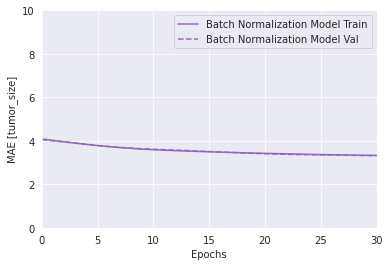

In [68]:
plotter.plot({'Batch Normalization Model': history_BN}, metric="mae")
plt.ylim([0, 10])
plt.ylabel('MAE [tumor_size]')

>> Plotting the **MSE** plot for train and val set by introducing Batch Normalization.

Text(0, 0.5, 'MSE [tumor_size^2]')

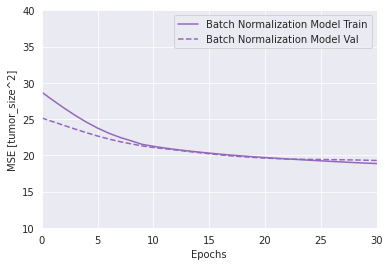

In [75]:
plotter.plot({'Batch Normalization Model': history_BN}, metric="mse")
plt.ylim([10, 40])
plt.ylabel('MSE [tumor_size^2]')

- The Batch Normalization model attains the **lowest validation set error**.

- We have significantly **reduced** the **overfitting**.

# **7. Apply the Training Model to Test Dataset**

In [70]:
test_data = norm_data(df_test.drop(['Id'],axis = 1))
pred_y= model4.predict(test_data)
pred_y

58/58 [==============================] - 0s 3ms/step


array([[ 8.091415 ],
       [ 1.6128747],
       [ 3.179928 ],
       ...,
       [15.946481 ],
       [ 5.652443 ],
       [14.781751 ]], dtype=float32)

In [71]:
pred_y = pred_y.flatten()


> Creating the submission file in csv format



In [72]:
smpl_Col = ['Id', 'tumor_size']
sample = pd.read_csv(filepath_or_buffer = "https://raw.githubusercontent.com/sm24abr/Data_Repo/main/MelanomaTumorDetection/sample_submission.csv",names = smpl_Col,header = None)
sample.head()

,Id,tumor_size
0,1962,16.262
1,7018,2.131
2,711,3.064
3,3443,1.992
4,7087,19.267


In [73]:
submission = pd.DataFrame({'Id':sample['Id'],'tumor_size':pred_y})
submission.to_csv('Submission.csv',header=False,index=False)

In [74]:
submission.head()

,Id,tumor_size
0,1962,8.091415
1,7018,1.612875
2,711,3.179928
3,3443,2.398988
4,7087,16.630890


# **8. Conclusion**

- We studied **in-depth** about the various **features** in the data, their **characteristics** and their **distributions**.

- We **removed** the columns which provided less information.

- We went through an **extensive** and **thorough** data analysis process, exploring various relationships between the **tumor_size** and the different other features.

- We found that as the unrecovarable area under study damaged by melanoma tumor increases (**damage_size**), the size of the tumor decreases and vice-versa as per this dataset. 

- Also as the ratio of normal to malign surface increases (**malign_ratio**), the size of the tumor also increases and vice-versa as per this dataset.

- We built differernt Deep learning models, performed and compared their performace using metrics like **MAE** and **MSE**.

- The model with **batch normalization** gave us the **best** result with less validation error.

- We created our **final model** using the model4, and made **predictions** on the test set using it.

# **9. Actionable Insights**

- Melanomas can develop anywhere on your body. They most often develop in areas that have had exposure to the sun, such as your back, legs, arms and face.

- Melanomas can also occur in areas that don't receive much sun exposure, such as the soles of your feet, palms of your hands and fingernail beds. These hidden melanomas are more common in people with darker skin.

- The main causes of this type of cancer are as follows:-
  1.   **Family history**
  2.   **Personal characteristics** like blue eyes, fair and/or red hair, pale complexion; skin reaction to sunlight (easily sunburned); freckling;
  3. **Sun exposure over a lifetim**e -High **UVB** and **UVA** radiation exposure (Recent evidence has shown that the risk of melanoma is higher in people who use sunscreen. Because sunscreen mostly blocks **UVB**, people using sunscreen may be exposed to **UVA** more than the general public, provided those people are exposed to the sun more than the public at large); low latitude; the number of blistering sunburns; use of tanning beds.
  4. **Socioeconomic status** - Lower socioeconomic status may be linked to more advanced disease at the time of detection. One survey of newly-diagnosed patients found that low-SES individuals have decreased melanoma risk perception and knowledge of the disease.

- Hence keeping these points in mind more awareness needs to be spread through social media and people with lower socio economic status need to be educated about the symptoms so that many lives can be saved through early diagnosis.


